In [1]:
import pandas as pd
import random
import dask.dataframe as dd
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
from sklearn.manifold import TSNE
from functools import reduce
import warnings 
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import DBSCAN

In [2]:
df1 = dd.read_csv("C:/Users/enriq/Desktop/EHD24/datahackdays_2024/features/1775_2023_cor_temp_features.csv").compute()
df2 = dd.read_csv("C:/Users/enriq/Desktop/EHD24/datahackdays_2024/features/1775_2023_mean_hour_day.csv").compute()
df3 = dd.read_csv("C:/Users/enriq/Desktop/EHD24/datahackdays_2024/features/1775_2023_stl_features.csv").compute()
df4 = dd.read_csv("C:/Users/enriq/Desktop/EHD24/datahackdays_2024/features/1775_2024_cor_sunshine_features.csv").compute()
df5 = dd.read_csv("C:/Users/enriq/Desktop/EHD24/datahackdays_2024/features/2023_1775_IDs_hourly_derivative.csv").compute()
# List of DataFrames to merge
dfs = [df1, df2, df3, df4, df5]

# Merge all DataFrames on 'id' and 'year_month' using reduce
merged_df = reduce(lambda left, right: pd.merge(left, right, on=['id', 'year_month'], how='inner'), dfs)



In [4]:
merged_df.sort_values("id", inplace=True)

In [5]:
# apply the clustering
monthly_features_df = merged_df
n_clusters = 4

monthly_features_df["cluster"] = -1
Xs_scaled = []
indices = []
labels = []

monthly_features_df["x"] = np.nan
monthly_features_df["y"] = np.nan

for year_month in monthly_features_df["year_month"].unique():
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].drop(columns=["id", "year_month"]))

    reducer = TSNE(n_components=2, random_state=42)
    X_scaled = np.nan_to_num(X_scaled)
    embedding = reducer.fit_transform(X_scaled)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "x"] = embedding[:, 0]
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "y"] = embedding[:, 1]

    kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=100, random_state=42)
    kmeans.fit(embedding)

    Xs_scaled.append(X_scaled)
    indices.append(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].index)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "cluster"] = kmeans.labels_

X_scaled = np.zeros((len(monthly_features_df), Xs_scaled[0].shape[1]))
for i, index in enumerate(indices):
    X_scaled[index] = Xs_scaled[i]

monthly_features_df.head()

,id,cor_kwh_temp,year_month,0,1,2,3,4,5,6,...,demand_change_kwh std,demand_change_kwh max,demand_change_kwh smooth_max,demand_change_kwh max_savgol,demand_change_kwh min,demand_change_kwh smooth_min,demand_change_kwh min_savgol,cluster,x,y
0,002da9d5719ff5fb0f53307ace9bc9e7,-0.181985,2023-01,0.629468,2.062040,2.034331,2.055927,0.603403,0.573677,0.093274,...,0.878937,3.316,1.7048,2.433829,-2.951,-1.42180,-2.078229,1,55.410587,1.798688
3544,002da9d5719ff5fb0f53307ace9bc9e7,-0.158586,2023-03,1.106484,1.866444,1.705710,1.107040,0.422113,0.381863,0.046161,...,0.785537,2.407,1.4204,2.154514,-3.015,-1.34200,-2.159829,2,47.099945,12.198359
5318,002da9d5719ff5fb0f53307ace9bc9e7,-0.099089,2023-04,1.768427,1.813969,0.973296,0.368019,0.333969,0.045815,0.020410,...,0.737585,2.453,1.3714,2.133914,-2.233,-1.42325,-1.994857,1,36.444599,23.072851
19508,002da9d5719ff5fb0f53307ace9bc9e7,-0.097585,2023-12,1.072500,1.940540,1.927911,1.267387,0.464153,0.501008,0.493306,...,0.627501,2.686,1.5470,2.208429,-2.319,-1.36000,-2.092314,0,58.532452,-1.712519
7093,002da9d5719ff5fb0f53307ace9bc9e7,-0.072696,2023-05,1.633387,1.630008,0.797065,0.181774,0.143177,0.033927,0.017734,...,0.703051,2.357,1.4938,2.274229,-2.393,-1.38840,-2.042714,0,34.854866,36.994049


In [6]:
# Filter DataFrame
filtered_df = monthly_features_df[monthly_features_df['year_month'].isin(['2023-02', '2023-09'])]
fig1 = px.scatter(filtered_df, x="x", y="y", animation_frame="year_month",
           color="cluster", hover_name="id")

fig1["layout"].pop("updatemenus") # optional, drop animation buttons
fig1.update_layout(width=500, height=500
                  )
fig1.show()

In [7]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Filter DataFrame for each month
df_february = monthly_features_df[monthly_features_df['year_month'] == '2023-02']
df_september = monthly_features_df[monthly_features_df['year_month'] == '2023-09']

# Create figures for each month
fig_february = px.scatter(df_february, x="x", y="y", color="cluster", hover_name="id")
fig_february.update_layout(title="February 2023", width=500, height=500)

fig_september = px.scatter(df_september, x="x", y="y", color="cluster", hover_name="id")
fig_september.update_layout(title="September 2023", width=500, height=500)

# Create a subplot grid with 1 row and 2 columns
fig1 = make_subplots(rows=1, cols=2, subplot_titles=("February 2023", "September 2023"))

# Add February plot (left)
for trace in fig_february.data:
    fig1.add_trace(trace, row=1, col=1)

# Add September plot (right)
for trace in fig_september.data:
    fig1.add_trace(trace, row=1, col=2)

# Update layout
fig1.update_layout(
    title_text="February vs September 2023",
    width=1000,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    showlegend=False  # Optional: Hide legend if needed
)

fig1.show()


In [8]:
# Assuming monthly_features_df is your DataFrame
corr_matrix = monthly_features_df.corr().abs()  # Compute the absolute correlation matrix

# Set a correlation threshold (e.g., 0.9)
threshold = 0.9

# Create a set to hold the columns to be removed
to_drop = set()

# Iterate over the columns of the correlation matrix
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if corr_matrix.iloc[i, j] > threshold:  # If the correlation is above the threshold
            colname = corr_matrix.columns[i]   # Get the name of the column
            to_drop.add(colname)               # Add it to the set

# Drop the highly correlated columns
reduced_df = monthly_features_df.drop(columns=to_drop)

In [9]:
# apply the clustering
monthly_features_df = reduced_df
n_clusters = 4

monthly_features_df["cluster"] = -1
Xs_scaled = []
indices = []
labels = []

monthly_features_df["x"] = np.nan
monthly_features_df["y"] = np.nan

for year_month in monthly_features_df["year_month"].unique():
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].drop(columns=["id", "year_month"]))

    reducer = TSNE(n_components=2, random_state=42)
    X_scaled = np.nan_to_num(X_scaled)
    embedding = reducer.fit_transform(X_scaled)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "x"] = embedding[:, 0]
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "y"] = embedding[:, 1]

    kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=100, random_state=42)
    kmeans.fit(embedding)

    Xs_scaled.append(X_scaled)
    indices.append(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].index)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "cluster"] = kmeans.labels_

X_scaled = np.zeros((len(monthly_features_df), Xs_scaled[0].shape[1]))
for i, index in enumerate(indices):
    X_scaled[index] = Xs_scaled[i]

monthly_features_df.head()

,id,cor_kwh_temp,year_month,0,1,2,3,4,5,6,...,23,cor_kwh_sunshine,Unnamed: 0,value_kwh std,value_kwh min,value_kwh max,demand_change_kwh mean,cluster,x,y
0,002da9d5719ff5fb0f53307ace9bc9e7,-0.181985,2023-01,0.629468,2.062040,2.034331,2.055927,0.603403,0.573677,0.093274,...,0.880452,-0.005999,0,0.772785,0.020,3.532,0.000792,1,51.047611,15.272304
3544,002da9d5719ff5fb0f53307ace9bc9e7,-0.158586,2023-03,1.106484,1.866444,1.705710,1.107040,0.422113,0.381863,0.046161,...,0.674419,-0.022064,2,0.705993,0.019,3.145,0.000369,2,39.477444,8.277915
5318,002da9d5719ff5fb0f53307ace9bc9e7,-0.099089,2023-04,1.768427,1.813969,0.973296,0.368019,0.333969,0.045815,0.020410,...,1.057487,0.006918,3,0.660658,0.016,2.940,-0.001361,2,43.322693,21.610596
19508,002da9d5719ff5fb0f53307ace9bc9e7,-0.097585,2023-12,1.072500,1.940540,1.927911,1.267387,0.464153,0.501008,0.493306,...,0.636895,0.030337,11,0.673579,0.018,3.258,-0.001209,2,51.171528,-5.065323
7093,002da9d5719ff5fb0f53307ace9bc9e7,-0.072696,2023-05,1.633387,1.630008,0.797065,0.181774,0.143177,0.033927,0.017734,...,0.854419,-0.060570,4,0.614618,0.004,2.439,-0.001380,1,38.112743,34.175018


In [10]:
# Filter DataFrame
filtered_df = monthly_features_df[monthly_features_df['year_month'].isin(['2023-02', '2023-09'])]
fig1 = px.scatter(filtered_df, x="x", y="y", animation_frame="year_month",
           color="cluster", hover_name="id")

fig1["layout"].pop("updatemenus") # optional, drop animation buttons
fig1.update_layout(width=500, height=500
                  )
fig1.show()

In [11]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Filter DataFrame for each month
df_february = monthly_features_df[monthly_features_df['year_month'] == '2023-02']
df_september = monthly_features_df[monthly_features_df['year_month'] == '2023-09']

# Create figures for each month
fig_february = px.scatter(df_february, x="x", y="y", color="cluster", hover_name="id")
fig_february.update_layout(title="February 2023", width=500, height=500)

fig_september = px.scatter(df_september, x="x", y="y", color="cluster", hover_name="id")
fig_september.update_layout(title="September 2023", width=500, height=500)

# Create a subplot grid with 1 row and 2 columns
fig1 = make_subplots(rows=1, cols=2, subplot_titles=("February 2023", "September 2023"))

# Add February plot (left)
for trace in fig_february.data:
    fig1.add_trace(trace, row=1, col=1)

# Add September plot (right)
for trace in fig_september.data:
    fig1.add_trace(trace, row=1, col=2)

# Update layout
fig1.update_layout(
    title_text="February vs September 2023",
    width=1000,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    showlegend=False  # Optional: Hide legend if needed
)

fig1.show()


In [12]:
from sklearn.mixture import GaussianMixture
# apply the clustering
monthly_features_df = merged_df
n_clusters = 4

monthly_features_df["cluster"] = -1
Xs_scaled = []
indices = []
labels = []

monthly_features_df["x"] = np.nan
monthly_features_df["y"] = np.nan

for year_month in monthly_features_df["year_month"].unique():
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].drop(columns=["id", "year_month"]))

    reducer = TSNE(n_components=2, random_state=42)
    X_scaled = np.nan_to_num(X_scaled)
    embedding = reducer.fit_transform(X_scaled)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "x"] = embedding[:, 0]
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "y"] = embedding[:, 1]

    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(embedding)

    Xs_scaled.append(X_scaled)
    indices.append(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].index)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "cluster"] = gmm.predict(embedding)

X_scaled = np.zeros((len(monthly_features_df), Xs_scaled[0].shape[1]))
for i, index in enumerate(indices):
    X_scaled[index] = Xs_scaled[i]

monthly_features_df.head()

,id,cor_kwh_temp,year_month,0,1,2,3,4,5,6,...,demand_change_kwh std,demand_change_kwh max,demand_change_kwh smooth_max,demand_change_kwh max_savgol,demand_change_kwh min,demand_change_kwh smooth_min,demand_change_kwh min_savgol,cluster,x,y
0,002da9d5719ff5fb0f53307ace9bc9e7,-0.181985,2023-01,0.629468,2.062040,2.034331,2.055927,0.603403,0.573677,0.093274,...,0.878937,3.316,1.7048,2.433829,-2.951,-1.42180,-2.078229,0,55.410587,1.798688
3544,002da9d5719ff5fb0f53307ace9bc9e7,-0.158586,2023-03,1.106484,1.866444,1.705710,1.107040,0.422113,0.381863,0.046161,...,0.785537,2.407,1.4204,2.154514,-3.015,-1.34200,-2.159829,1,47.099945,12.198359
5318,002da9d5719ff5fb0f53307ace9bc9e7,-0.099089,2023-04,1.768427,1.813969,0.973296,0.368019,0.333969,0.045815,0.020410,...,0.737585,2.453,1.3714,2.133914,-2.233,-1.42325,-1.994857,0,36.444599,23.072851
19508,002da9d5719ff5fb0f53307ace9bc9e7,-0.097585,2023-12,1.072500,1.940540,1.927911,1.267387,0.464153,0.501008,0.493306,...,0.627501,2.686,1.5470,2.208429,-2.319,-1.36000,-2.092314,2,58.532452,-1.712519
7093,002da9d5719ff5fb0f53307ace9bc9e7,-0.072696,2023-05,1.633387,1.630008,0.797065,0.181774,0.143177,0.033927,0.017734,...,0.703051,2.357,1.4938,2.274229,-2.393,-1.38840,-2.042714,0,34.854866,36.994049


In [13]:
fig2 = px.scatter(monthly_features_df, x="x", y="y", animation_frame="year_month",
           color="cluster", hover_name="id")

fig2["layout"].pop("updatemenus") # optional, drop animation buttons
fig2.update_layout(width=500, height=500)
fig2.show()

In [14]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Filter DataFrame for each month
df_february = monthly_features_df[monthly_features_df['year_month'] == '2023-02']
df_september = monthly_features_df[monthly_features_df['year_month'] == '2023-09']

# Create figures for each month
fig_february = px.scatter(df_february, x="x", y="y", color="cluster", hover_name="id")
fig_february.update_layout(title="February 2023", width=500, height=500)

fig_september = px.scatter(df_september, x="x", y="y", color="cluster", hover_name="id")
fig_september.update_layout(title="September 2023", width=500, height=500)

# Create a subplot grid with 1 row and 2 columns
fig2 = make_subplots(rows=1, cols=2, subplot_titles=("February 2023", "September 2023"))

# Add February plot (left)
for trace in fig_february.data:
    fig2.add_trace(trace, row=1, col=1)

# Add September plot (right)
for trace in fig_september.data:
    fig2.add_trace(trace, row=1, col=2)

# Update layout
fig2.update_layout(
    title_text="February vs September 2023",
    width=1000,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    showlegend=False  # Optional: Hide legend if needed
)

fig2.show()


In [15]:
from sklearn.decomposition import PCA
# apply the clustering
# apply the clustering
monthly_features_df = merged_df
n_clusters = 3

monthly_features_df["cluster"] = -1
Xs_scaled = []
indices = []
labels = []

monthly_features_df["x"] = np.nan
monthly_features_df["y"] = np.nan

for year_month in monthly_features_df["year_month"].unique():
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].drop(columns=["id", "year_month"]))

    # Replace TSNE with PCA
    pca = PCA(n_components=2, random_state=42)
    X_scaled = np.nan_to_num(X_scaled)
    embedding = pca.fit_transform(X_scaled)
    
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "x"] = embedding[:, 0]
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "y"] = embedding[:, 1]

    kmeans = MiniBatchKMeans(n_clusters=n_clusters, batch_size=100, random_state=42)
    kmeans.fit(embedding)

    Xs_scaled.append(X_scaled)
    indices.append(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].index)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "cluster"] = kmeans.labels_

X_scaled = np.zeros((len(monthly_features_df), Xs_scaled[0].shape[1]))
for i, index in enumerate(indices):
    X_scaled[index] = Xs_scaled[i]

monthly_features_df.head()

,id,cor_kwh_temp,year_month,0,1,2,3,4,5,6,...,demand_change_kwh std,demand_change_kwh max,demand_change_kwh smooth_max,demand_change_kwh max_savgol,demand_change_kwh min,demand_change_kwh smooth_min,demand_change_kwh min_savgol,cluster,x,y
0,002da9d5719ff5fb0f53307ace9bc9e7,-0.181985,2023-01,0.629468,2.062040,2.034331,2.055927,0.603403,0.573677,0.093274,...,0.878937,3.316,1.7048,2.433829,-2.951,-1.42180,-2.078229,1,17.439161,4.038184
3544,002da9d5719ff5fb0f53307ace9bc9e7,-0.158586,2023-03,1.106484,1.866444,1.705710,1.107040,0.422113,0.381863,0.046161,...,0.785537,2.407,1.4204,2.154514,-3.015,-1.34200,-2.159829,1,14.713709,5.497623
5318,002da9d5719ff5fb0f53307ace9bc9e7,-0.099089,2023-04,1.768427,1.813969,0.973296,0.368019,0.333969,0.045815,0.020410,...,0.737585,2.453,1.3714,2.133914,-2.233,-1.42325,-1.994857,2,12.877307,6.357139
19508,002da9d5719ff5fb0f53307ace9bc9e7,-0.097585,2023-12,1.072500,1.940540,1.927911,1.267387,0.464153,0.501008,0.493306,...,0.627501,2.686,1.5470,2.208429,-2.319,-1.36000,-2.092314,1,16.358629,3.213180
7093,002da9d5719ff5fb0f53307ace9bc9e7,-0.072696,2023-05,1.633387,1.630008,0.797065,0.181774,0.143177,0.033927,0.017734,...,0.703051,2.357,1.4938,2.274229,-2.393,-1.38840,-2.042714,2,7.847899,8.444772


In [16]:
fig3 = px.scatter(monthly_features_df, x="x", y="y", animation_frame="year_month",
           color="cluster", hover_name="id")

fig3["layout"].pop("updatemenus") # optional, drop animation buttons
fig3.update_layout(width=500, height=500
                  )
fig3.show()

In [17]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Filter DataFrame for each month
df_february = monthly_features_df[monthly_features_df['year_month'] == '2023-02']
df_september = monthly_features_df[monthly_features_df['year_month'] == '2023-09']

# Create figures for each month
fig_february = px.scatter(df_february, x="x", y="y", color="cluster", hover_name="id")
fig_february.update_layout(title="February 2023", width=500, height=500)

fig_september = px.scatter(df_september, x="x", y="y", color="cluster", hover_name="id")
fig_september.update_layout(title="September 2023", width=500, height=500)

# Create a subplot grid with 1 row and 2 columns
fig3 = make_subplots(rows=1, cols=2, subplot_titles=("February 2023", "September 2023"))

# Add February plot (left)
for trace in fig_february.data:
    fig3.add_trace(trace, row=1, col=1)

# Add September plot (right)
for trace in fig_september.data:
    fig3.add_trace(trace, row=1, col=2)

# Update layout
fig3.update_layout(
    title_text="February vs September 2023",
    width=1000,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    showlegend=False  # Optional: Hide legend if needed
)

fig3.show()


In [18]:
from sklearn.svm import SVC
from sklearn.cluster import DBSCAN
monthly_features_df = merged_df
n_clusters = 4  # Number of clusters for DBSCAN

monthly_features_df["cluster"] = -1
Xs_scaled = []
indices = []

monthly_features_df["x"] = np.nan
monthly_features_df["y"] = np.nan

for year_month in monthly_features_df["year_month"].unique():
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].drop(columns=["id", "year_month", "cluster"]))

    reducer = PCA(n_components=2, random_state=42)
    X_scaled = np.nan_to_num(X_scaled)
    embedding = reducer.fit_transform(X_scaled)
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "x"] = embedding[:, 0]
    monthly_features_df.loc[monthly_features_df["year_month"] == year_month, "y"] = embedding[:, 1]

    Xs_scaled.append(X_scaled)
    indices.append(monthly_features_df.loc[monthly_features_df["year_month"] == year_month].index)

X_scaled = np.zeros((len(monthly_features_df), Xs_scaled[0].shape[1]))
for i, index in enumerate(indices):
    X_scaled[index] = Xs_scaled[i]

# Clustering with DBSCAN
dbscan = DBSCAN(eps=0.265, )  # Adjust parameters as needed
monthly_features_df["cluster"] = dbscan.fit_predict(X_scaled)

monthly_features_df.head()


,id,cor_kwh_temp,year_month,0,1,2,3,4,5,6,...,demand_change_kwh std,demand_change_kwh max,demand_change_kwh smooth_max,demand_change_kwh max_savgol,demand_change_kwh min,demand_change_kwh smooth_min,demand_change_kwh min_savgol,cluster,x,y
0,002da9d5719ff5fb0f53307ace9bc9e7,-0.181985,2023-01,0.629468,2.062040,2.034331,2.055927,0.603403,0.573677,0.093274,...,0.878937,3.316,1.7048,2.433829,-2.951,-1.42180,-2.078229,-1,17.439161,4.038184
3544,002da9d5719ff5fb0f53307ace9bc9e7,-0.158586,2023-03,1.106484,1.866444,1.705710,1.107040,0.422113,0.381863,0.046161,...,0.785537,2.407,1.4204,2.154514,-3.015,-1.34200,-2.159829,-1,14.713709,5.497623
5318,002da9d5719ff5fb0f53307ace9bc9e7,-0.099089,2023-04,1.768427,1.813969,0.973296,0.368019,0.333969,0.045815,0.020410,...,0.737585,2.453,1.3714,2.133914,-2.233,-1.42325,-1.994857,-1,12.877307,6.357139
19508,002da9d5719ff5fb0f53307ace9bc9e7,-0.097585,2023-12,1.072500,1.940540,1.927911,1.267387,0.464153,0.501008,0.493306,...,0.627501,2.686,1.5470,2.208429,-2.319,-1.36000,-2.092314,-1,16.358629,3.213180
7093,002da9d5719ff5fb0f53307ace9bc9e7,-0.072696,2023-05,1.633387,1.630008,0.797065,0.181774,0.143177,0.033927,0.017734,...,0.703051,2.357,1.4938,2.274229,-2.393,-1.38840,-2.042714,-1,7.847899,8.444772


In [19]:
fig4 = px.scatter(monthly_features_df, x="x", y="y", animation_frame="year_month",
           color="cluster", hover_name="id")

fig4["layout"].pop("updatemenus") # optional, drop animation buttons
fig4.update_layout(width=500, height=500
                  )
fig4.show()

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# Filter DataFrame for each month
df_february = monthly_features_df[monthly_features_df['year_month'] == '2023-02']
df_september = monthly_features_df[monthly_features_df['year_month'] == '2023-09']

# Create figures for each month
fig_february = px.scatter(df_february, x="x", y="y", color="cluster", hover_name="id")
fig_february.update_layout(title="February 2023", width=500, height=500)

fig_september = px.scatter(df_september, x="x", y="y", color="cluster", hover_name="id")
fig_september.update_layout(title="September 2023", width=500, height=500)

# Create a subplot grid with 1 row and 2 columns
fig4 = make_subplots(rows=1, cols=2, subplot_titles=("February 2023", "September 2023"))

# Add February plot (left)
for trace in fig_february.data:
    fig4.add_trace(trace, row=1, col=1)

# Add September plot (right)
for trace in fig_september.data:
    fig4.add_trace(trace, row=1, col=2)

# Update layout
fig4.update_layout(
    title_text="February vs September 2023",
    width=1000,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    showlegend=False  # Optional: Hide legend if needed
)

fig4.show()


In [21]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a subplot grid with 4 rows and 2 columns
fig = make_subplots(
    rows=4, cols=2,  # 4 rows, 2 columns
        vertical_spacing=0.1,  # Adjust this value to reduce space between rows
    subplot_titles=("T-SNE / KMeans February", "T-SNE / KMeans September",
                    "T-SNE / GMM February", "T-SNE / GMM September",
                    "PCA / KMeans February", "PCA / KMeans September",
                    "PCA / DBSCAN February", "PCA / DBSCAN February")  # Titles for each subplot
)

# Add traces from fig1 to the first row
for i, trace in enumerate(fig1.data):
    trace.update(showlegend=False)  # Hide the colorbar
    fig.add_trace(trace, row=1, col=i+1)  # Add to row 1, col 1 and 2

# Add traces from fig2 to the second row
for i, trace in enumerate(fig2.data):
    trace.update(showlegend=False)  # Hide the colorbar
    fig.add_trace(trace, row=2, col=i+1)  # Add to row 2, col 1 and 2

# Add traces from fig3 to the third row
for i, trace in enumerate(fig3.data):
    trace.update(showlegend=False)  # Hide the colorbar
    fig.add_trace(trace, row=3, col=i+1)  # Add to row 3, col 1 and 2

# Add traces from fig4 to the fourth row
for i, trace in enumerate(fig4.data):
    trace.update(showlegend=False)  # Hide the colorbar
    fig.add_trace(trace, row=4, col=i+1)  # Add to row 4, col 1 and 2

# Update layout
fig.update_layout(
    height=700,  # Adjust height as needed
    width=600,   # Adjust width as needed
    title_text="Stacked Figures with Two Columns"
)

# Show the combined figure
fig.show()


<AxesSubplot: >

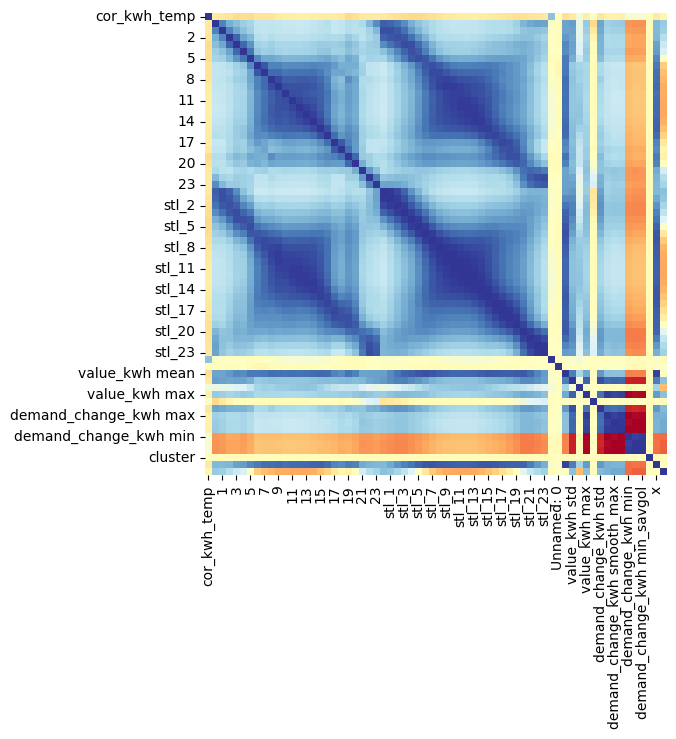

In [22]:
import numpy as np
import seaborn as sns

corr = monthly_features_df.corr()
corr.style.background_gradient(cmap="RdYlBu")

# Plot the correlation matrix
fig, ax = plt.subplots(figsize=(8, 6))  # Adjust the figsize to control the size of the plot

# Use the seaborn heatmap to plot only the colors
sns.heatmap(
    corr,
    cmap="RdYlBu",
    annot=False,  # Do not show the correlation values
    cbar=False,   # Remove the colorbar if you do not need it
    square=True,  # Make cells square-shaped
    ax=ax
)

In [23]:
# Assuming monthly_features_df is your DataFrame
corr_matrix = monthly_features_df.corr().abs()  # Compute the absolute correlation matrix

# Set a correlation threshold (e.g., 0.9)
threshold = 0.9

# Create a set to hold the columns to be removed
to_drop = set()

# Iterate over the columns of the correlation matrix
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if corr_matrix.iloc[i, j] > threshold:  # If the correlation is above the threshold
            colname = corr_matrix.columns[i]   # Get the name of the column
            to_drop.add(colname)               # Add it to the set

# Drop the highly correlated columns
reduced_df = monthly_features_df.drop(columns=to_drop)